In [2]:
#импортируем необходимые библиотеки
import pandas as pd
import ydata_profiling
import sqlite3

1. Прочитать корректно файл в виде датафрейма. Разрешается работать с
файлом только через Jupyter Notebook

In [4]:
df = pd.read_excel('sales_df.xlsx', skiprows=2)
df

,Traransaction Id,transaction_date,Transaction Time,customer_id,instore_yn,line_item_id,Product Id,quantity,line_item_amount,unit_price,...,ProductGroup,product_category,product_type,product,unit_of_measure,sales_outlet_type,store_address,store_city,store_state_province,manager
0,7.0,2019-04-01,12:04:43,558.0,N,1.0,52.0,1.0,2.5,2.50,...,Beverages,Tea,Brewed Chai tea,Traditional Blend Chai Rg,16 oz,retail,32-20 Broadway,Long Island City,NY,6.0
1,11.0,2019-04-01,15:54:39,781.0,N,1.0,27.0,2.0,7,3.50,...,Beverages,Coffee,Organic brewed coffee,Brazilian Lg,24 oz,retail,32-20 Broadway,Long Island City,NY,6.0
2,19.0,2019-04-01,14:34:59,788.0,Y,1.0,46.0,2.0,5,2.50,...,Beverages,Tea,Brewed Green tea,Serenity Green Tea Rg,16 oz,retail,32-20 Broadway,Long Island City,NY,6.0
3,32.0,2019-04-01,16:06:04,683.0,N,1.0,23.0,2.0,5,2.50,...,Beverages,Coffee,Drip coffee,Our Old Time Diner Blend Rg,16 oz,retail,32-20 Broadway,Long Island City,NY,6.0
4,33.0,2019-04-01,19:18:37,99.0,Y,1.0,34.0,1.0,2.45,2.45,...,Beverages,Coffee,Premium brewed coffee,Jamaican Coffee River Sm,8 oz,retail,32-20 Broadway,Long Island City,NY,6.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49895,753.0,2019-04-29,16:51:58,0.0,N,1.0,30.0,1.0,3,3.00,...,Beverages,Coffee,Gourmet brewed coffee,Columbian Medium Roast Lg,24 oz,retail,687 9th Avenue,New York,NY,31.0
49896,756.0,2019-04-29,16:51:14,8412.0,Y,1.0,25.0,2.0,4.4,2.20,...,Beverages,Coffee,Organic brewed coffee,Brazilian Sm,8 oz,retail,687 9th Avenue,New York,NY,31.0
49897,759.0,2019-04-29,11:17:36,0.0,Y,1.0,31.0,1.0,2.2,2.20,...,Beverages,Coffee,Gourmet brewed coffee,Ethiopia Sm,8 oz,retail,687 9th Avenue,New York,NY,31.0
49898,763.0,2019-04-29,15:45:52,8030.0,N,1.0,44.0,2.0,5,2.50,...,Beverages,Tea,Brewed herbal tea,Peppermint Rg,16 oz,retail,687 9th Avenue,New York,NY,31.0


2. Проверить количество строк и столбцов

In [5]:
df.shape

(49900, 21)

3. Привести все колонки к одному naming convention

In [6]:
df.columns

Index(['Traransaction Id', 'transaction_date', 'Transaction Time',
       'customer_id', 'instore_yn', 'line_item_id', 'Product Id', 'quantity',
       'line_item_amount', 'unit_price', 'promo_item_yn', 'ProductGroup',
       'product_category', 'product_type', 'product', 'unit_of_measure',
       'sales_outlet_type', 'store_address', 'store_city',
       'store_state_province', 'manager'],
      dtype='object')

In [7]:
#переименуем названия колонок
df.rename(columns=
{
        'Traransaction Id' : 'transaction_id',
        'Transaction Time' : 'transaction_time',
        'Product Id' : 'product_id',
        'ProductGroup' : 'product_group',
        'product' : 'product_name',
        'manager' : 'manager_id'
},
inplace=True)

In [8]:
#перепроверим датафрейм
df.head()

,transaction_id,transaction_date,transaction_time,customer_id,instore_yn,line_item_id,product_id,quantity,line_item_amount,unit_price,...,product_group,product_category,product_type,product_name,unit_of_measure,sales_outlet_type,store_address,store_city,store_state_province,manager_id
0,7.0,2019-04-01,12:04:43,558.0,N,1.0,52.0,1.0,2.5,2.50,...,Beverages,Tea,Brewed Chai tea,Traditional Blend Chai Rg,16 oz,retail,32-20 Broadway,Long Island City,NY,6.0
1,11.0,2019-04-01,15:54:39,781.0,N,1.0,27.0,2.0,7,3.50,...,Beverages,Coffee,Organic brewed coffee,Brazilian Lg,24 oz,retail,32-20 Broadway,Long Island City,NY,6.0
2,19.0,2019-04-01,14:34:59,788.0,Y,1.0,46.0,2.0,5,2.50,...,Beverages,Tea,Brewed Green tea,Serenity Green Tea Rg,16 oz,retail,32-20 Broadway,Long Island City,NY,6.0
3,32.0,2019-04-01,16:06:04,683.0,N,1.0,23.0,2.0,5,2.50,...,Beverages,Coffee,Drip coffee,Our Old Time Diner Blend Rg,16 oz,retail,32-20 Broadway,Long Island City,NY,6.0
4,33.0,2019-04-01,19:18:37,99.0,Y,1.0,34.0,1.0,2.45,2.45,...,Beverages,Coffee,Premium brewed coffee,Jamaican Coffee River Sm,8 oz,retail,32-20 Broadway,Long Island City,NY,6.0


4. Проверить типы данных

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49900 entries, 0 to 49899
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   transaction_id        49894 non-null  float64
 1   transaction_date      49894 non-null  object 
 2   transaction_time      49894 non-null  object 
 3   customer_id           49894 non-null  float64
 4   instore_yn            49894 non-null  object 
 5   line_item_id          49894 non-null  float64
 6   product_id            49894 non-null  float64
 7   quantity              49894 non-null  float64
 8   line_item_amount      49894 non-null  object 
 9   unit_price            49894 non-null  float64
 10  promo_item_yn         49894 non-null  object 
 11  product_group         49894 non-null  object 
 12  product_category      49894 non-null  object 
 13  product_type          49894 non-null  object 
 14  product_name          49894 non-null  object 
 15  unit_of_measure    

5. Запустить отчет профайлинга и проанализировать его результаты,
написать тезисно результаты в ноутбуке

In [10]:
df.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Исправить:
- 126 пустых строк
- 19 дубликатов
- в колонке instore_yn и promo_item_yn нужно стандартизировать данные
- колонка line_item_amount не поддерживается, возможно, из-за неправильного типа данных
- в колонке sales_outlet_type нужно стандартизировать данные


6. Проверить данные на пустые значения. При необходимости удалить
или заменить пустые значения. Чистовые значения можно заменять на
среднее или медианное значение, категориальные атрибуты заменять
на «не определено»

In [11]:
#проверяем количество пустых значений в каждом столбце
df.isnull().sum()

transaction_id          6
transaction_date        6
transaction_time        6
customer_id             6
instore_yn              6
line_item_id            6
product_id              6
quantity                6
line_item_amount        6
unit_price              6
promo_item_yn           6
product_group           6
product_category        6
product_type            6
product_name            6
unit_of_measure         6
sales_outlet_type       6
store_address           6
store_city              6
store_state_province    6
manager_id              6
dtype: int64

In [12]:
#смотрим пустые значения в данных
df[df.isna().any(axis=1)]

,transaction_id,transaction_date,transaction_time,customer_id,instore_yn,line_item_id,product_id,quantity,line_item_amount,unit_price,...,product_group,product_category,product_type,product_name,unit_of_measure,sales_outlet_type,store_address,store_city,store_state_province,manager_id
17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
63,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
73,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
294,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
299,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
412,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [13]:
#убираем пустые значения
df = df[~df.isna().any(axis=1)]

In [14]:
#перепроверяем количество строк
df.shape

(49894, 21)

7. Проверить данные на дубликаты. При необходимости удалить
дубликаты из датафрейма

In [15]:
#проверяем данные на дубликаты
df[df.duplicated()].sort_values('transaction_id')

,transaction_id,transaction_date,transaction_time,customer_id,instore_yn,line_item_id,product_id,quantity,line_item_amount,unit_price,...,product_group,product_category,product_type,product_name,unit_of_measure,sales_outlet_type,store_address,store_city,store_state_province,manager_id
3956,7.0,2019-04-08,09:32:15,410.0,Y,1.0,44.0,1.0,2.5,2.50,...,Beverages,Tea,Brewed herbal tea,Peppermint Rg,16 oz,retail,32-20 Broadway,Long Island City,NY,6.0
40662,9.0,2019-04-14,08:47:06,0.0,N,5.0,78.0,1.0,4.5,4.50,...,Food,Bakery,Scone,Scottish Cream Scone,single,retail,687 9th Avenue,New York,NY,31.0
20406,23.0,2019-04-08,09:38:08,5362.0,Y,1.0,41.0,1.0,4.25,4.25,...,Beverages,Coffee,Barista Espresso,Cappuccino Lg,3.0 oz,retail,100 Church Street,New York,NY,16.0
21010,32.0,2019-04-09,09:56:57,5095.0,Y,1.0,40.0,1.0,3.75,3.75,...,Beverages,Coffee,Barista Espresso,Cappuccino,1.5 oz,retail,100 Church Street,New York,NY,16.0
20448,50.0,2019-04-08,07:30:17,5438.0,Y,1.0,39.0,1.0,4.25,4.25,...,Beverages,Coffee,Barista Espresso,Latte Rg,3.0 oz,retail,100 Church Street,New York,NY,16.0
11793,203.0,2019-04-21,08:29:44,18.0,N,1.0,71.0,1.0,1,3.75,...,Food,Bakery,Pastry,Chocolate Croissant,single,retail,32-20 Broadway,Long Island City,NY,6.0
40224,203.0,2019-04-13,08:50:03,0.0,N,1.0,71.0,1.0,3.75,3.75,...,Food,Bakery,Pastry,Chocolate Croissant,single,retail,687 9th Avenue,New York,NY,31.0
20150,204.0,2019-04-07,08:06:36,5531.0,N,1.0,71.0,1.0,1,3.75,...,Food,Bakery,Pastry,Chocolate Croissant,single,retail,100 Church Street,New York,NY,16.0
40974,205.0,2019-04-14,10:11:55,0.0,N,1.0,71.0,1.0,3.75,3.75,...,Food,Bakery,Pastry,Chocolate Croissant,single,retail,687 9th Avenue,New York,NY,31.0
20154,206.0,2019-04-07,10:10:26,5563.0,Y,1.0,71.0,1.0,1,3.75,...,Food,Bakery,Pastry,Chocolate Croissant,single,retail,100 Church Street,New York,NY,16.0


In [16]:
#проверяем один из дубликатов
df[(df['transaction_id']==208.0) & (df['transaction_date']=='2019-04-21')]

,transaction_id,transaction_date,transaction_time,customer_id,instore_yn,line_item_id,product_id,quantity,line_item_amount,unit_price,...,product_group,product_category,product_type,product_name,unit_of_measure,sales_outlet_type,store_address,store_city,store_state_province,manager_id
11798,208.0,2019-04-21,10:55:47,202.0,N,1.0,71.0,1.0,1,3.75,...,Food,Bakery,Pastry,Chocolate Croissant,single,retail,32-20 Broadway,Long Island City,NY,6.0
11799,208.0,2019-04-21,10:55:47,202.0,N,1.0,71.0,1.0,1,3.75,...,Food,Bakery,Pastry,Chocolate Croissant,single,retail,32-20 Broadway,Long Island City,NY,6.0
45148,208.0,2019-04-21,09:51:43,0.0,N,1.0,71.0,1.0,3.75,3.75,...,Food,Bakery,Pastry,Chocolate Croissant,single,retail,687 9th Avenue,New York,NY,31.0
45149,208.0,2019-04-21,09:51:43,0.0,N,5.0,71.0,1.0,3.75,3.75,...,Food,Bakery,Pastry,Chocolate Croissant,single,retail,687 9th Avenue,New York,NY,31.0


In [17]:
#удаление дубликатов
df = df.drop_duplicates()

In [18]:
#перепроверка кол-ва колонок
df.shape

(49875, 21)

In [19]:
#перепроверяем, что дубликаты удалились
df[df.duplicated()].sort_values('transaction_id')

,transaction_id,transaction_date,transaction_time,customer_id,instore_yn,line_item_id,product_id,quantity,line_item_amount,unit_price,...,product_group,product_category,product_type,product_name,unit_of_measure,sales_outlet_type,store_address,store_city,store_state_province,manager_id


In [20]:
#проверяем дубликаты по order_id
len(df[df['transaction_id'].duplicated()])

45672

In [21]:
#смотрим в данных
df[df['transaction_id'].duplicated()]

,transaction_id,transaction_date,transaction_time,customer_id,instore_yn,line_item_id,product_id,quantity,line_item_amount,unit_price,...,product_group,product_category,product_type,product_name,unit_of_measure,sales_outlet_type,store_address,store_city,store_state_province,manager_id
30,156.0,2019-04-01,12:30:00,32.0,N,5.0,77.0,1.0,3,3.00,...,Food,Bakery,Scone,Oatmeal Scone,single,retail,32-20 Broadway,Long Island City,NY,6.0
36,199.0,2019-04-01,14:24:55,112.0,Y,5.0,79.0,1.0,3.75,3.75,...,Food,Bakery,Scone,Jumbo Savory Scone,single,retail,32-20 Broadway,Long Island City,NY,6.0
56,296.0,2019-04-01,14:49:18,328.0,Y,5.0,79.0,1.0,3.75,3.75,...,Food,Bakery,Scone,Jumbo Savory Scone,single,retail,32-20 Broadway,Long Island City,NY,6.0
67,357.0,2019-04-01,15:34:10,530.0,N,5.0,76.0,1.0,3.5,3.50,...,Food,Bakery,Biscotti,Chocolate Chip Biscotti,single,retail,32-20 Broadway,Long Island City,NY,6.0
76,391.0,2019-04-01,18:05:52,216.0,N,5.0,79.0,1.0,3.75,3.75,...,Food,Bakery,Scone,Jumbo Savory Scone,single,retail,32-20 Broadway,Long Island City,NY,6.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49895,753.0,2019-04-29,16:51:58,0.0,N,1.0,30.0,1.0,3,3.00,...,Beverages,Coffee,Gourmet brewed coffee,Columbian Medium Roast Lg,24 oz,retail,687 9th Avenue,New York,NY,31.0
49896,756.0,2019-04-29,16:51:14,8412.0,Y,1.0,25.0,2.0,4.4,2.20,...,Beverages,Coffee,Organic brewed coffee,Brazilian Sm,8 oz,retail,687 9th Avenue,New York,NY,31.0
49897,759.0,2019-04-29,11:17:36,0.0,Y,1.0,31.0,1.0,2.2,2.20,...,Beverages,Coffee,Gourmet brewed coffee,Ethiopia Sm,8 oz,retail,687 9th Avenue,New York,NY,31.0
49898,763.0,2019-04-29,15:45:52,8030.0,N,1.0,44.0,2.0,5,2.50,...,Beverages,Tea,Brewed herbal tea,Peppermint Rg,16 oz,retail,687 9th Avenue,New York,NY,31.0


In [22]:
# transaction_id не уникальна, дублируется при условии разных дат, времени и т.д.
df[df['transaction_id']==753.0]

,transaction_id,transaction_date,transaction_time,customer_id,instore_yn,line_item_id,product_id,quantity,line_item_amount,unit_price,...,product_group,product_category,product_type,product_name,unit_of_measure,sales_outlet_type,store_address,store_city,store_state_province,manager_id
763,753.0,2019-04-02,16:06:18,703.0,N,1.0,39.0,1.0,4.25,4.25,...,Beverages,Coffee,Barista Espresso,Latte Rg,3.0 oz,retail,32-20 Broadway,Long Island City,NY,6.0
9798,753.0,2019-04-18,10:08:12,0.0,N,1.0,33.0,2.0,7,3.50,...,Beverages,Coffee,Gourmet brewed coffee,Ethiopia Lg,24 oz,retail,32-20 Broadway,Long Island City,NY,6.0
12105,753.0,2019-04-22,10:56:50,631.0,Y,1.0,41.0,1.0,4.25,4.25,...,Beverages,Coffee,Barista Espresso,Cappuccino Lg,3.0 oz,retail,32-20 Broadway,Long Island City,NY,6.0
16968,753.0,2019-04-01,10:30:07,5384.0,Y,1.0,35.0,1.0,3.1,3.10,...,Beverages,Coffee,Premium brewed coffee,Jamaican Coffee River Rg,16 oz,retail,100 Church Street,New York,NY,16.0
16969,753.0,2019-04-01,10:30:07,5384.0,Y,5.0,70.0,1.0,3.25,3.25,...,Food,Bakery,Scone,Cranberry Scone,single,retail,100 Church Street,New York,NY,16.0
24704,753.0,2019-04-15,08:46:39,0.0,N,1.0,28.0,2.0,4,2.00,...,Beverages,Coffee,Gourmet brewed coffee,Columbian Medium Roast Sm,8 oz,retail,100 Church Street,New York,NY,16.0
30352,753.0,2019-04-25,10:37:58,0.0,Y,1.0,27.0,2.0,7,3.50,...,Beverages,Coffee,Organic brewed coffee,Brazilian Lg,24 oz,retail,100 Church Street,New York,NY,16.0
32360,753.0,2019-04-28,07:19:19,5541.0,Y,1.0,60.0,2.0,7.5,3.75,...,Beverages,Drinking Chocolate,Hot chocolate,Sustainably Grown Organic Rg,12 oz,retail,100 Church Street,New York,NY,16.0
33522,753.0,2019-04-02,17:49:46,8275.0,Y,1.0,87.0,2.0,6,3.00,...,Beverages,Coffee,Barista Espresso,Ouro Brasileiro shot,1.5 oz,retail,687 9th Avenue,New York,NY,31.0
41594,753.0,2019-04-15,09:34:27,0.0,N,1.0,41.0,2.0,8.5,4.25,...,Beverages,Coffee,Barista Espresso,Cappuccino Lg,3.0 oz,retail,687 9th Avenue,New York,NY,31.0


8. Изменить типы данные при необходимости

In [23]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 49875 entries, 0 to 49899
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   transaction_id        49875 non-null  float64
 1   transaction_date      49875 non-null  object 
 2   transaction_time      49875 non-null  object 
 3   customer_id           49875 non-null  float64
 4   instore_yn            49875 non-null  object 
 5   line_item_id          49875 non-null  float64
 6   product_id            49875 non-null  float64
 7   quantity              49875 non-null  float64
 8   line_item_amount      49875 non-null  object 
 9   unit_price            49875 non-null  float64
 10  promo_item_yn         49875 non-null  object 
 11  product_group         49875 non-null  object 
 12  product_category      49875 non-null  object 
 13  product_type          49875 non-null  object 
 14  product_name          49875 non-null  object 
 15  unit_of_measure       49

In [24]:
#меняем тип данных у line_item_amount
df.line_item_amount = df.line_item_amount.astype('float')

ValueError: could not convert string to float: '3point25'

In [25]:
#смотрим строку
df[df.line_item_amount == '3point25']

,transaction_id,transaction_date,transaction_time,customer_id,instore_yn,line_item_id,product_id,quantity,line_item_amount,unit_price,...,product_group,product_category,product_type,product_name,unit_of_measure,sales_outlet_type,store_address,store_city,store_state_province,manager_id
401,1745.0,2019-04-01,16:58:42,753.0,Y,5.0,69.0,1.0,3point25,3.25,...,Food,Bakery,Biscotti,Hazelnut Biscotti,single,retail,32-20 Broadway,Long Island City,NY,6.0


In [26]:
#замена содержимого ячейки
df.line_item_amount = df.line_item_amount.replace('3point25', 3.25)

In [27]:
#проверяем строку
df[df.index == 401]

,transaction_id,transaction_date,transaction_time,customer_id,instore_yn,line_item_id,product_id,quantity,line_item_amount,unit_price,...,product_group,product_category,product_type,product_name,unit_of_measure,sales_outlet_type,store_address,store_city,store_state_province,manager_id
401,1745.0,2019-04-01,16:58:42,753.0,Y,5.0,69.0,1.0,3.25,3.25,...,Food,Bakery,Biscotti,Hazelnut Biscotti,single,retail,32-20 Broadway,Long Island City,NY,6.0


In [28]:
#меняем тип данных у line_item_amount
df.line_item_amount = df.line_item_amount.astype('float')

In [29]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 49875 entries, 0 to 49899
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   transaction_id        49875 non-null  float64
 1   transaction_date      49875 non-null  object 
 2   transaction_time      49875 non-null  object 
 3   customer_id           49875 non-null  float64
 4   instore_yn            49875 non-null  object 
 5   line_item_id          49875 non-null  float64
 6   product_id            49875 non-null  float64
 7   quantity              49875 non-null  float64
 8   line_item_amount      49875 non-null  float64
 9   unit_price            49875 non-null  float64
 10  promo_item_yn         49875 non-null  object 
 11  product_group         49875 non-null  object 
 12  product_category      49875 non-null  object 
 13  product_type          49875 non-null  object 
 14  product_name          49875 non-null  object 
 15  unit_of_measure       49

In [30]:
#поменяем типы данных на int сразу в нескольких колонках
df[['transaction_id', 'customer_id', 'line_item_id', 'product_id', 'quantity', 'manager_id']] = df[['transaction_id', 'customer_id', 'line_item_id', 'product_id', 'quantity', 'manager_id']].astype(int)

In [31]:
#меняем тип данных со строки на дату
df.transaction_date = df.transaction_date.apply(pd.to_datetime)

In [32]:
#проверяем тип данных еще раз
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 49875 entries, 0 to 49899
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   transaction_id        49875 non-null  int32         
 1   transaction_date      49875 non-null  datetime64[ns]
 2   transaction_time      49875 non-null  object        
 3   customer_id           49875 non-null  int32         
 4   instore_yn            49875 non-null  object        
 5   line_item_id          49875 non-null  int32         
 6   product_id            49875 non-null  int32         
 7   quantity              49875 non-null  int32         
 8   line_item_amount      49875 non-null  float64       
 9   unit_price            49875 non-null  float64       
 10  promo_item_yn         49875 non-null  object        
 11  product_group         49875 non-null  object        
 12  product_category      49875 non-null  object        
 13  product_type         

9. Заменить данные Y/N на Yes/No во всех колонках, где это релевантно

In [33]:
df = df.replace(['Y', 'N'], ['Yes', 'No'])

In [34]:
df = df.replace(['Yest'], 'Yes')

In [35]:
df.head()

,transaction_id,transaction_date,transaction_time,customer_id,instore_yn,line_item_id,product_id,quantity,line_item_amount,unit_price,...,product_group,product_category,product_type,product_name,unit_of_measure,sales_outlet_type,store_address,store_city,store_state_province,manager_id
0,7,2019-04-01,12:04:43,558,No,1,52,1,2.50,2.50,...,Beverages,Tea,Brewed Chai tea,Traditional Blend Chai Rg,16 oz,retail,32-20 Broadway,Long Island City,NY,6
1,11,2019-04-01,15:54:39,781,No,1,27,2,7.00,3.50,...,Beverages,Coffee,Organic brewed coffee,Brazilian Lg,24 oz,retail,32-20 Broadway,Long Island City,NY,6
2,19,2019-04-01,14:34:59,788,Yes,1,46,2,5.00,2.50,...,Beverages,Tea,Brewed Green tea,Serenity Green Tea Rg,16 oz,retail,32-20 Broadway,Long Island City,NY,6
3,32,2019-04-01,16:06:04,683,No,1,23,2,5.00,2.50,...,Beverages,Coffee,Drip coffee,Our Old Time Diner Blend Rg,16 oz,retail,32-20 Broadway,Long Island City,NY,6
4,33,2019-04-01,19:18:37,99,Yes,1,34,1,2.45,2.45,...,Beverages,Coffee,Premium brewed coffee,Jamaican Coffee River Sm,8 oz,retail,32-20 Broadway,Long Island City,NY,6


10. Стандартизировать данные в колонках, отличающиеся по
написанию

In [36]:
df.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [37]:
#смотрим уникальные значения в колонках
df.instore_yn.unique()

array(['No', 'Yes', ' '], dtype=object)

In [38]:
#заменяем пустые значения в nstore_yn на N/A, далее по аналогии проверяем уникальные значения, заменяем на нужные
df['instore_yn'] = df['instore_yn'].replace(' ', 'N/A')

In [39]:
df.product_group.unique()

array(['Beverages', 'Food', 'Beverage', 'Whole Bean/Teas', 'Merchandise',
       'Add-ons'], dtype=object)

In [40]:
df['product_group'] = df['product_group'].replace('Beverage', 'Beverages')

In [41]:
df.product_category.unique()

array(['Tea', 'Coffee', 'Drinking Chocolate', 'Bakery', 'COFFEE',
       'Packaged Chocolate', 'Coffee beans', 'Branded', 'Flavours',
       'Loose Tea'], dtype=object)

In [42]:
df['product_category'] = df['product_category'].replace('COFFEE', 'Coffee')

In [43]:
df.product_type.unique()

array(['Brewed Chai tea', 'Organic brewed coffee', 'Brewed Green tea',
       'Drip coffee', 'Premium brewed coffee', 'Gourmet brewed coffee',
       'Brewed Black tea', 'Hot chocolate', 'Barista Espresso', 'Scone',
       'Brewed herbal tea', 'Biscotti', 'Pastry', 'Drinking Chocolate',
       'Premium Beans', 'Housewares', 'Sugar free syrup', 'Chai tea',
       'Regular syrup', 'Green tea', 'Black tea', 'Espresso Beans',
       'House blend Beans', 'Gourmet Beans', 'Clothing', 'Green beans',
       'Herbal tea', 'Organic Beans', 'Organic Chocolate'], dtype=object)

In [44]:
df.product_name.unique()

array(['Traditional Blend Chai Rg', 'Brazilian Lg',
       'Serenity Green Tea Rg', 'Our Old Time Diner Blend Rg',
       'Jamaican Coffee River Sm', 'Ethiopia Rg', 'English Breakfast Lg',
       'Sustainably Grown Organic Rg', 'Earl Grey Lg',
       'Jamaican Coffee River Rg', 'Serenity Green Tea Lg',
       'Brazilian Sm', 'English Breakfast Rg',
       'Traditional Blend Chai Lg', 'Cappuccino', 'Espresso shot',
       'Cappuccino Lg', 'Latte', 'Earl Grey Rg', 'Dark chocolate Lg',
       'Columbian Medium Roast Sm', 'Oatmeal Scone',
       'Morning Sunrise Chai Lg', 'Morning Sunrise Chai Rg',
       'Peppermint Lg', 'Jumbo Savory Scone', 'Lemon Grass Lg',
       'Sustainably Grown Organic Lg', 'Dark chocolate Rg',
       'Lemon Grass Rg', 'Ethiopia Sm', 'Latte Rg',
       'Our Old Time Diner Blend Sm', 'Chocolate Chip Biscotti',
       'Columbian Medium Roast Rg', 'Ethiopia Lg', 'Brazilian Rg',
       'Columbian Medium Roast Lg', 'Spicy Eye Opener Chai Rg',
       'Ginger Biscotti', 

In [45]:
df.unit_of_measure.unique()

array(['16 oz', '24 oz', '8 oz', '12 oz', '1.5 oz', '3.0 oz', 'single',
       '1 lb', '.5 lb', 'pump', '.9 oz', '1 oz'], dtype=object)

In [46]:
df.sales_outlet_type.unique()

array(['retail', 'Retail'], dtype=object)

In [47]:
df['sales_outlet_type'] = df['sales_outlet_type'].replace('retail', 'Retail')

In [48]:
df.sales_outlet_type.unique()

array(['Retail'], dtype=object)

11. Вывести список уникальных значений product_category

In [49]:
df.product_category.unique()

array(['Tea', 'Coffee', 'Drinking Chocolate', 'Bakery',
       'Packaged Chocolate', 'Coffee beans', 'Branded', 'Flavours',
       'Loose Tea'], dtype=object)

12. Отфильтровать данные датафрейма и оставить транзакции с
product id из списка (23, 25, 27, 32, 34, 35, 49). Вывести количество
строк, которые остались в датафрейме после фильтрации.

In [50]:
#фильтруем данные 
df12 = df[df.product_id.isin([23, 25, 27, 32, 34, 35, 49])]

In [64]:
#количество строк, которые остались в датафрейме после фильтрации
len(df12)

6546

13. Оставить только часть столбцов в датафрейме: transaction_id,
transaction_date, transaction_time, customer_id, product_id, quantity,
unit_price, store_address, manager

In [53]:
df13 = df12[['transaction_id', 'transaction_date', 'transaction_time', 'customer_id', 'product_id', 'quantity', 'unit_price', 'store_address', 'manager_id']]

In [54]:
df13

,transaction_id,transaction_date,transaction_time,customer_id,product_id,quantity,unit_price,store_address,manager_id
1,11,2019-04-01,15:54:39,781,27,2,3.50,32-20 Broadway,6
3,32,2019-04-01,16:06:04,683,23,2,2.50,32-20 Broadway,6
4,33,2019-04-01,19:18:37,99,34,1,2.45,32-20 Broadway,6
5,39,2019-04-01,18:54:46,664,32,1,3.00,32-20 Broadway,6
6,50,2019-04-01,13:03:49,316,49,2,3.00,32-20 Broadway,6
...,...,...,...,...,...,...,...,...,...
49868,692,2019-04-29,16:30:33,8185,25,2,2.20,687 9th Avenue,31
49869,693,2019-04-29,17:02:05,0,35,2,3.10,687 9th Avenue,31
49881,719,2019-04-29,11:52:45,0,27,1,3.50,687 9th Avenue,31
49887,737,2019-04-29,11:48:45,0,49,1,3.00,687 9th Avenue,31


14. Рассчитать количество проданных товаров по категориям.
*(дополнительно) Визуализировать результат в виде столбчатой
диаграммы

In [56]:
df14 = df12.groupby('product_category')['quantity'].sum().reset_index()
df14

,product_category,quantity
0,Coffee,8600
1,Tea,1429


In [59]:
df14.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2 entries, 0 to 1
Data columns (total 2 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   product_category  2 non-null      object
 1   quantity          2 non-null      int32 
dtypes: int32(1), object(1)
memory usage: 156.0+ bytes


In [60]:
import matplotlib 
import matplotlib_inline
import matplotlib.pyplot as plt

In [61]:
%matplotlib inline

<Axes: ylabel='product_category'>

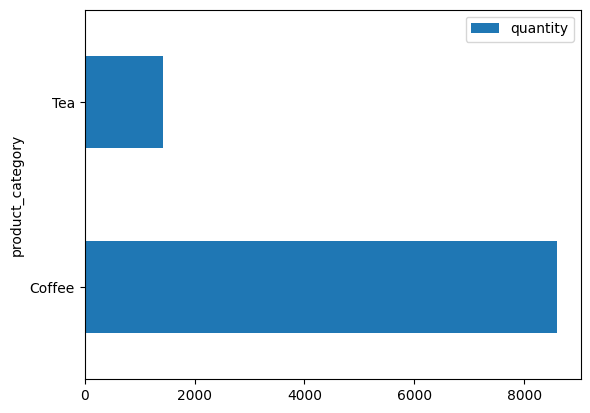

In [62]:
x= ('product_category')
y= ('quantity')
df14.sort_values(by='quantity', ascending=False).plot(x, y, kind="barh")

15. Рассчитать сумму продаж на каждый день.
*(дополнительно) Визуализировать результат в виде графика. Написать
возможные выводы или гипотезы исходя из данных

In [63]:
df15 = df12.groupby('transaction_date')['line_item_amount'].sum().reset_index()
df15

,transaction_date,line_item_amount
0,2019-04-01,1072.50
1,2019-04-02,1000.00
2,2019-04-03,1026.00
3,2019-04-04,1021.50
4,2019-04-05,1110.35
5,2019-04-06,954.35
6,2019-04-07,1048.55
7,2019-04-08,887.20
8,2019-04-09,808.05
9,2019-04-10,990.75


<Axes: xlabel='transaction_date'>

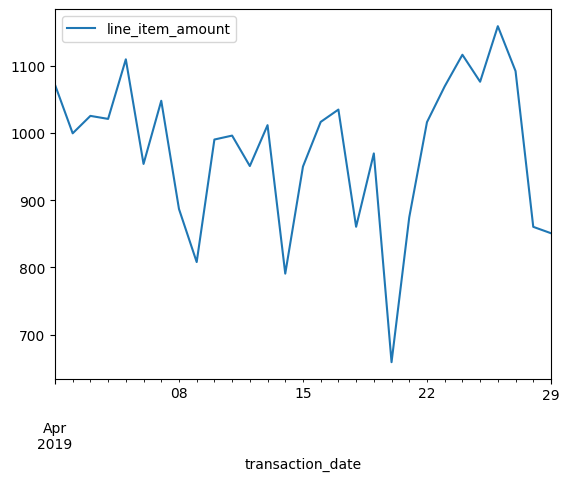

In [65]:
a=('transaction_date')
b=('line_item_amount')
df15.plot(a, b)

В общем, график продаж колеблется в пределах от 800 до 1100 и имеет тенденцию к снижению продаж к концу месяца. Также встречаются предельно низкие (2019-04-20	658.75) и предельно высокие (2019-04-26	1159.75) значения. Однако эти предельные значения скорее можно признать выбросами, т.к. они слабо характеризуют данную выборку.

16. Запустить еще раз отчет профайлинга для преобразованного
датафрейма. Посмотреть, как изменились результаты

In [66]:
df12.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

17. Выгрузить преобразованный датафрейм в excel файл

In [67]:
df12.to_excel('final_df.xlsx', index=False)